In [36]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import hvplot.pandas
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

In [2]:
data_df = pd.read_csv("Resources/tracks.csv")
data_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [3]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      586672 non-null  float64
 9   energy            586672 non-null  float64
 10  key               586672 non-null  int64  
 11  loudness          586672 non-null  float64
 12  mode              586672 non-null  int64  
 13  speechiness       586672 non-null  float64
 14  acousticness      586672 non-null  float64
 15  instrumentalness  586672 non-null  float64
 16  liveness          58

In [4]:
data_features_df = data_df.drop(labels =['id','name','artists','id_artists','release_date'],axis = 1)
column_names = data_features_df.columns

data_scaled = StandardScaler().fit_transform(data_features_df)
data_transformed_df = pd.DataFrame(data_scaled,columns = column_names)
data_transformed_df.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,-1.174160,-0.815233,-0.214754,0.490096,-0.385182,-1.483654,-0.615393,0.719665,1.924128,0.642528,2.362779,-0.341434,-1.650527,-0.457392,-1.845842
1,-1.500768,-1.042088,-0.214754,0.791115,-1.107625,-1.483654,-2.344110,0.719665,4.736917,0.995129,-0.425120,-0.357710,0.398600,-0.552876,-6.072724
2,-1.500768,-0.382618,-0.214754,-0.780204,-1.449000,-1.199517,-2.156266,0.719665,-0.298309,1.559864,-0.343432,-0.010498,-0.369823,0.401596,2.381040
3,-1.500768,-0.420026,-0.214754,-1.460507,-1.776084,0.505310,-3.488663,0.719665,-0.302756,1.562730,3.014787,-0.596418,-0.602678,1.730782,-1.845842
4,-1.500768,-0.529308,-0.214754,-0.972856,-1.524420,-0.631241,-1.315289,-1.389536,-0.366127,1.545530,0.062013,0.526596,-1.382743,-0.512190,0.267599


In [12]:
# Create a a list to store inertia values and the values of k
inertia = []
k = list(range(1, 20))

In [13]:
# Create a for-loop where each value of k is evaluated using the K-means algorithm
# Fit the model using the service_ratings DataFrame
# Append the value of the computed inertia from the `inertia_` attribute of the KMeans model instance
for i in k:
    k_model = KMeans(n_clusters=i, random_state=402030)
    k_model.fit(data_transformed_df)
    inertia.append(k_model.inertia_)

In [30]:
# Define a DataFrame to hold the values for k and the corresponding inertia
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)

df_elbow['inertia diff'] = df_elbow['inertia'].diff()

# Review the DataFrame
df_elbow.sort_values(by='inertia diff', ascending = True)

,k,inertia,inertia diff
1,2,7.512652e+06,-1.287428e+06
2,3,6.911492e+06,-6.011594e+05
3,4,6.356520e+06,-5.549723e+05
4,5,5.983522e+06,-3.729982e+05
5,6,5.633138e+06,-3.503831e+05
6,7,5.380532e+06,-2.526063e+05
7,8,5.171446e+06,-2.090858e+05
8,9,4.972507e+06,-1.989397e+05
10,11,4.679826e+06,-1.641935e+05
11,12,4.531213e+06,-1.486132e+05


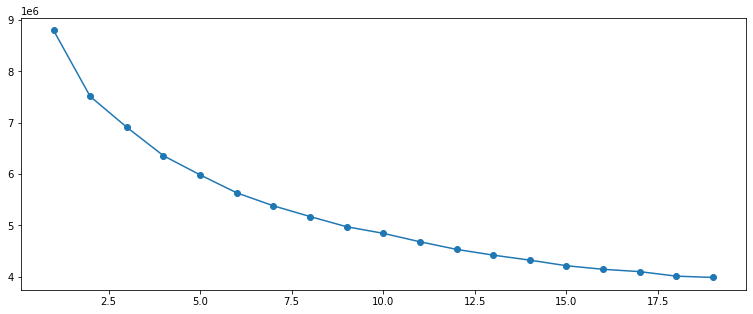

In [26]:
# Plot the DataFrame
plt.figure(figsize = (13,5))

plt.plot(df_elbow["k"].values, 
         df_elbow["inertia"].values, linestyle='-', marker='o')
plt.show()

# Kmeans clustering

In [31]:
model = KMeans(n_clusters = 15, random_state = 402030)

# Print the model
model

KMeans(n_clusters=15, random_state=402030)

In [32]:
model.fit(data_transformed_df)

KMeans(n_clusters=15, random_state=402030)

In [33]:
genre_clusters = model.predict(data_transformed_df)

print(genre_clusters)

[ 2 11  3 ...  6  9  9]


In [34]:
genre_rating_predictions_df = data_transformed_df.copy()

genre_rating_predictions_df['genre clusters'] = genre_clusters

genre_rating_predictions_df

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre clusters
0,-1.174160,-0.815233,-0.214754,0.490096,-0.385182,-1.483654,-0.615393,0.719665,1.924128,0.642528,2.362779,-0.341434,-1.650527,-0.457392,-1.845842,2
1,-1.500768,-1.042088,-0.214754,0.791115,-1.107625,-1.483654,-2.344110,0.719665,4.736917,0.995129,-0.425120,-0.357710,0.398600,-0.552876,-6.072724,11
2,-1.500768,-0.382618,-0.214754,-0.780204,-1.449000,-1.199517,-2.156266,0.719665,-0.298309,1.559864,-0.343432,-0.010498,-0.369823,0.401596,2.381040,3
3,-1.500768,-0.420026,-0.214754,-1.460507,-1.776084,0.505310,-3.488663,0.719665,-0.302756,1.562730,3.014787,-0.596418,-0.602678,1.730782,-1.845842,2
4,-1.500768,-0.529308,-0.214754,-0.972856,-1.524420,-0.631241,-1.315289,-1.389536,-0.366127,1.545530,0.062013,0.526596,-1.382743,-0.512190,0.267599,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,1.220968,0.223004,-0.214754,-0.021636,-0.095410,-1.483654,0.537413,-1.389536,-0.420604,0.960729,-0.425120,-0.809085,-1.324530,0.451253,0.267599,6
586668,2.418532,-0.606659,-0.214754,1.212541,0.480163,-1.483654,0.979122,0.719665,-0.220485,-0.885409,-0.424007,-0.659350,0.518909,1.062561,0.267599,0
586669,2.309662,-0.335506,-0.214754,-0.172146,-0.905182,0.505310,-0.514201,-1.389536,-0.356121,1.276063,-0.424558,-0.686476,-1.886099,0.894707,0.267599,6
586670,1.656446,-0.695890,-0.214754,0.797135,0.289629,1.357723,0.784793,0.719665,-0.391142,-0.699075,-0.425111,0.494045,-0.443560,-0.955375,0.267599,9


# PCA

In [41]:
pca = PCA(n_components=2)

In [54]:
pca_data = pca.fit_transform(data_transformed_df)

pca_data[:,:2]

array([[ 2.50623459, -1.14588147],
       [ 3.3272473 , -5.09030778],
       [ 2.64578528, -0.23300901],
       ...,
       [ 0.7891165 ,  0.97001604],
       [-1.37504711, -0.07266043],
       [-1.95683985, -0.51423194]])

In [48]:
pca1 = pca_data[:,0]
pca2 = pca_data[:,1]

In [43]:
pca.explained_variance_ratio_

array([0.21286606, 0.1032469 , 0.08266641])

In [57]:
# Creating a DataFrame with the PCA data
df_genre_pca = pd.DataFrame(pca_data[:,:2], columns=["PC1", "PC2"])

# Review the DataFrame
df_genre_pca.head()

,PC1,PC2
0,2.506235,-1.145881
1,3.327247,-5.090308
2,2.645785,-0.233009
3,4.929989,0.491725
4,3.097742,0.031080


In [61]:
df_genre_pca['genre clusters'] = genre_rating_predictions_df['genre clusters']
df_genre_pca.head()

,PC1,PC2,genre clusters
0,2.506235,-1.145881,2
1,3.327247,-5.090308,11
2,2.645785,-0.233009,3
3,4.929989,0.491725,2
4,3.097742,0.031080,3


In [63]:
# Create the scatter plot with x="PC1" and y="PC2"
df_genre_pca.hvplot.scatter(
    x="PC1",
    y="PC2",
    by="genre clusters",
    title = "Scatter Plot by genre Segment - PCA=2"
)

:NdOverlay   [genre clusters]
   :Scatter   [PC1]   (PC2)